  crop_name soil_type  crop_age_days  day_of_year  temperature_C  humidity_%  \
0    Tomato     Sandy             55          324          19.90       74.79   
1     Wheat     Silty             96           89          19.39       61.01   
2     Maize     Sandy             36          161          30.20       93.53   
3    Tomato     Silty            114          334          20.59       51.75   
4    Tomato     Silty             37           75          36.59       93.87   

   rainfall_mm  effective_rainfall_mm  solar_radiation_MJ_m2_day  \
0         1.08                   0.55                      18.94   
1         2.07                   1.21                      27.04   
2         2.11                   1.27                      29.09   
3         4.61                   3.06                      27.12   
4         0.40                   0.35                       7.68   

   wind_speed_m_s  ...  soil_moisture_%  \
0            2.72  ...            20.25   
1            3.20  ...  

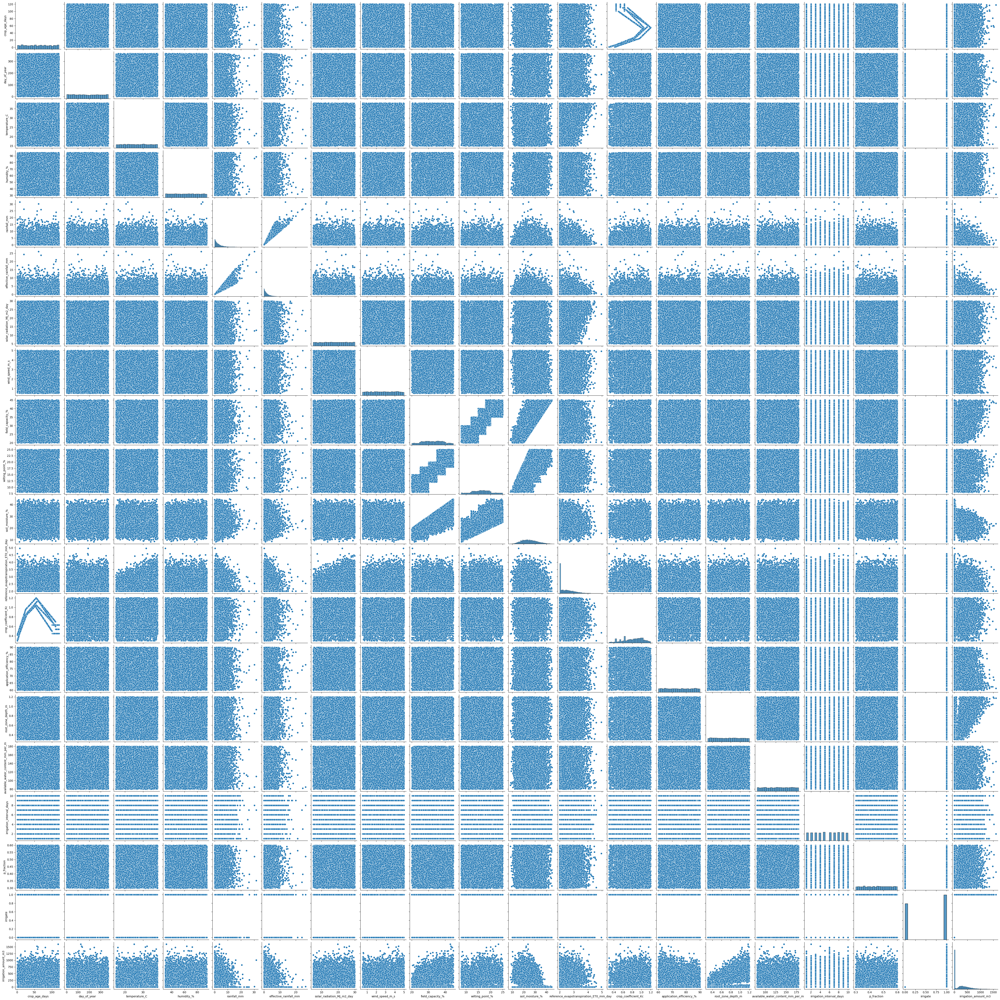

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import joblib  # For saving model

# Load dataset (download CSV from Kaggle first)
df = pd.read_csv('Smart_irrigation_dataset.csv')  # Update path
print(df.head())
print(df.info())
print(df.describe())
sns.pairplot(df)
plt.show()


In [2]:
print("Exact Columns:", df.columns.tolist())
print("\nFirst 3 rows:\n", df.iloc[:, :6].head(3))  # Preview key cols

df = df.dropna(subset=['temperature_C', 'humidity_%', 'soil_moisture_%', 'irrigate'])

# Exact matching features from your file [file:94]
X = df[['temperature_C', 'humidity_%', 'soil_moisture_%', 'rainfall_mm', 
        'solar_radiation_MJ_m2_day', 'wind_speed_m_s']].fillna(df.mean(numeric_only=True))

# Binary target: irrigate (0/1 already perfect)
y = df['irrigate']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"\n✅ Ready! X shape: {X.shape}, y balance: {y.value_counts().to_dict()}")
print(X.head())

Exact Columns: ['crop_name', 'soil_type', 'crop_age_days', 'day_of_year', 'temperature_C', 'humidity_%', 'rainfall_mm', 'effective_rainfall_mm', 'solar_radiation_MJ_m2_day', 'wind_speed_m_s', 'field_capacity_%', 'wilting_point_%', 'soil_moisture_%', 'reference_evapotranspiration_ET0_mm_day', 'crop_coefficient_Kc', 'application_efficiency_%', 'root_zone_depth_m', 'available_water_content_mm_per_m', 'irrigation_interval_days', 'p_fraction', 'irrigate', 'irrigation_amount_m3']

First 3 rows:
   crop_name soil_type  crop_age_days  day_of_year  temperature_C  humidity_%
0    Tomato     Sandy             55          324          19.90       74.79
1     Wheat     Silty             96           89          19.39       61.01
2     Maize     Sandy             36          161          30.20       93.53

✅ Ready! X shape: (10000, 6), y balance: {1: 5538, 0: 4462}
   temperature_C  humidity_%  soil_moisture_%  rainfall_mm  \
0          19.90       74.79            20.25         1.08   
1          1

Accuracy: 64.30%
              precision    recall  f1-score   support

           0       0.62      0.53      0.57       905
           1       0.66      0.73      0.69      1095

    accuracy                           0.64      2000
   macro avg       0.64      0.63      0.63      2000
weighted avg       0.64      0.64      0.64      2000



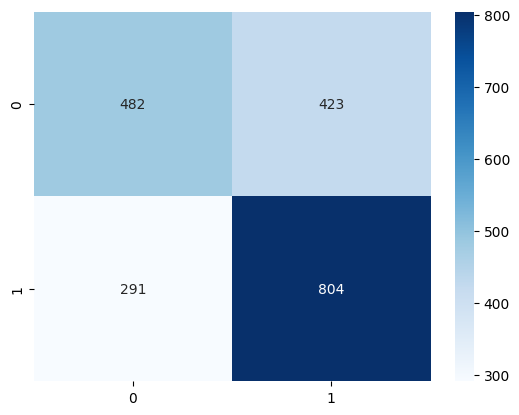

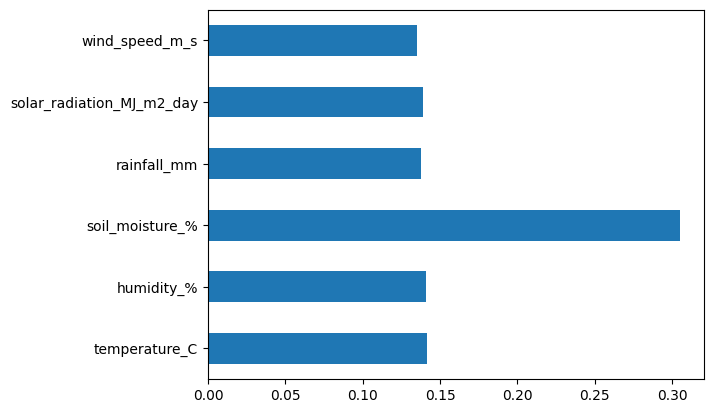

In [3]:
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2%}")
print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.show()
pd.Series(model.feature_importances_, index=X.columns).plot(kind='barh')
plt.show()

In [4]:
joblib.dump(model, 'irrigation_model.pkl')
print("Model saved!")

Model saved!
